In [237]:
import csv
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import cpi

from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV, learning_curve
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.pipeline import make_pipeline
import lazypredict
from lazypredict.Supervised import LazyRegressor
from sklearn.feature_selection import SelectKBest, f_regression

In [197]:
#Data comes from Kaggle Baseball Databank - https://www.kaggle.com/open-source-sports/baseball-databank?rvi=1

salaries = pd.read_csv("Salaries.csv")

print(salaries.shape)
salaries.head()

(25575, 6)


,yearID,teamID,lgID,playerID,salary,year_team_ID
0,1985,ATL,NL,barkele01,870000,1985_ATL
1,1985,ATL,NL,bedrost01,550000,1985_ATL
2,1985,ATL,NL,benedbr01,545000,1985_ATL
3,1985,ATL,NL,campri01,633333,1985_ATL
4,1985,ATL,NL,ceronri01,625000,1985_ATL


In [198]:
teams = pd.read_csv("Teams.csv")

print(teams.shape)
teams.head()

(888, 49)


,yearID,lgID,teamID,franchID,divID,Rank,G,Ghome,W,L,...,FP,name,park,attendance,BPF,PPF,teamIDBR,teamIDlahman45,teamIDretro,year_team_ID
0,1985,NL,ATL,ATL,W,5,162,81,66,96,...,0.97,Atlanta Braves,Atlanta-Fulton County Stadium,1350137,105,106,ATL,ATL,ATL,1985_ATL
1,1985,AL,BAL,BAL,E,4,161,81,83,78,...,0.98,Baltimore Orioles,Memorial Stadium,2132387,97,97,BAL,BAL,BAL,1985_BAL
2,1985,AL,BOS,BOS,E,5,163,81,81,81,...,0.97,Boston Red Sox,Fenway Park II,1786633,104,104,BOS,BOS,BOS,1985_BOS
3,1985,AL,CAL,ANA,W,2,162,79,90,72,...,0.98,California Angels,Anaheim Stadium,2567427,100,100,CAL,CAL,CAL,1985_CAL
4,1985,AL,CHA,CHW,W,3,163,81,85,77,...,0.98,Chicago White Sox,Comiskey Park,1669888,104,104,CHW,CHA,CHA,1985_CHA


In [199]:
salaries_sum = salaries.groupby("year_team_ID").sum()
salaries_sum.head()

,yearID,salary
year_team_ID,,
1985_ATL,43670,14807000
1985_BAL,43670,11560712
1985_BOS,49625,10897560
1985_CAL,55580,14427894
1985_CHA,41685,9846178


In [200]:
cpi.update()

In [201]:
salaries_sum['year_team_ID'] = salaries_sum.index
salaries_sum['yearID'] = salaries_sum['year_team_ID'].str.split("_", n=1, expand=True)[0]

salaries_sum['salary_real'] = salaries_sum.apply(lambda x: cpi.inflate(int(x["salary"]), int(x["yearID"])), axis=1)
salaries_sum['salary_real_log'] = np.log(salaries_sum['salary_real'])

salaries_sum.head()

,yearID,salary,year_team_ID,salary_real,salary_real_log
year_team_ID,,,,,
1985_ATL,1985,14807000,1985_ATL,34555217.00,17.36
1985_BAL,1985,11560712,1985_BAL,26979328.14,17.11
1985_BOS,1985,10897560,1985_BOS,25431724.90,17.05
1985_CAL,1985,14427894,1985_CAL,33670494.23,17.33
1985_CHA,1985,9846178,1985_CHA,22978106.12,16.95


In [202]:
print(salaries_sum['salary_real_log'].mean())
print(salaries_sum['salary_real_log'].std())
print(salaries_sum['salary_real_log'].mean() - 3 * salaries_sum['salary_real_log'].std())
print(salaries_sum['salary_real_log'].mean() + 3 * salaries_sum['salary_real_log'].std())
salaries_sum['salary_real_log'].sort_values().head()

17.966085803201672
0.6325224532448737
16.068518443467052
19.86365316293629


year_team_ID
1987_TEX   14.48
1987_SEA   15.43
1985_SEA   16.19
1988_TEX   16.24
1988_PIT   16.36
Name: salary_real_log, dtype: float64

In [203]:
merged_all = teams[['year_team_ID','W','R','2B','3B','HR','BB','SO','SB','RA','ER','ERA','HA','HRA','BBA','SOA','E','DP','FP','attendance','BPF','PPF']].merge(salaries_sum[['salary_real']], on='year_team_ID', left_index=True, how='left', copy=False)
merged_all.drop(['year_team_ID'], axis=1, inplace=True)
print(merged_all.shape)
merged_all.head()

(888, 22)


,W,R,2B,3B,HR,BB,SO,SB,RA,ER,...,HRA,BBA,SOA,E,DP,FP,attendance,BPF,PPF,salary_real
0,66,632,213,28,126,553,849,72,781,678,...,134,642,776,159,197,0.97,1350137,105,106,34555217.00
1,83,818,234,22,214,604,908,69,764,694,...,160,568,793,115,168,0.98,2132387,97,97,26979328.14
2,81,800,292,31,162,562,816,66,720,659,...,130,540,913,145,161,0.97,1786633,104,104,25431724.90
3,90,732,215,31,153,648,902,106,703,633,...,171,514,767,112,202,0.98,2567427,100,100,33670494.23
4,85,736,247,37,146,471,843,108,720,656,...,161,569,1023,111,152,0.98,1669888,104,104,22978106.12


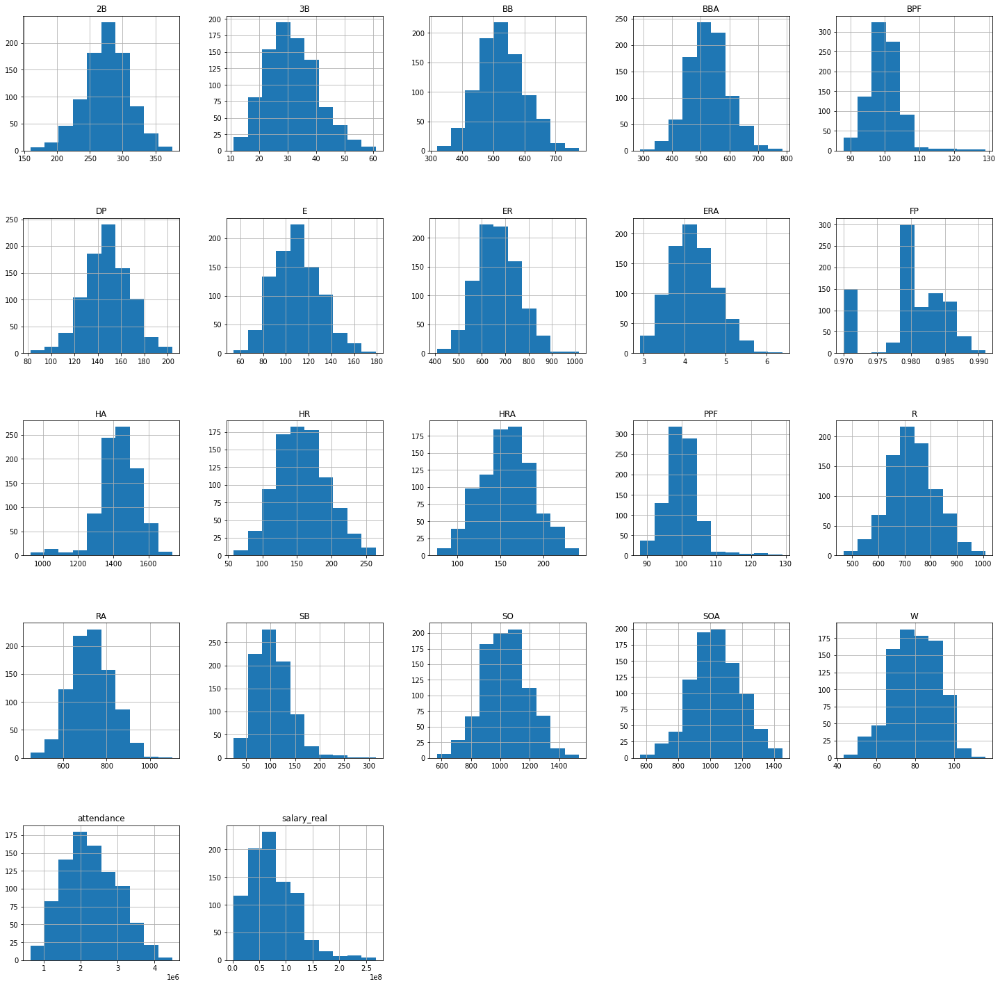

In [204]:
# districutions for the data
merged_all.hist(figsize=(25,25))
plt.subplots_adjust(hspace=0.5)

In [205]:
for col in merged_all.columns:
    if col == 'year_team_ID':
        continue
    else:
        mean = merged_all[col].mean()
        std = merged_all[col].std()
        cut_off = std * 3
        
        lower, upper = mean - cut_off, mean + cut_off
        outlier_count = len(merged_all[col].dropna()) - len(merged_all[(merged_all[col] < upper) & (merged_all[col] > lower)][col].dropna())
        print(f"{col} has {outlier_count} outlier(s) in a sample size of {len(merged_all[col].dropna())}.")
        
        #if outlier_count > 0:
        #    merged_all[[col]] = merged_all[[col]].mask(merged_all[[col]] < lower, other=None)
        #    merged_all[[col]] = merged_all[[col]].mask(merged_all[[col]] > upper, other=None)
        #    outlier_count = len(merged_all[col].dropna()) - len(merged_all[(merged_all[col] < upper) & (merged_all[col] > lower)][col].dropna())
        #    print(f"\tMask attempted. {col} now has {outlier_count} outlier(s) in a sample size of {len(merged_all[col].dropna())}.")

W has 2 outlier(s) in a sample size of 888.
R has 1 outlier(s) in a sample size of 888.
2B has 3 outlier(s) in a sample size of 888.
3B has 4 outlier(s) in a sample size of 888.
HR has 0 outlier(s) in a sample size of 888.
BB has 3 outlier(s) in a sample size of 888.
SO has 4 outlier(s) in a sample size of 888.
SB has 9 outlier(s) in a sample size of 888.
RA has 2 outlier(s) in a sample size of 888.
ER has 2 outlier(s) in a sample size of 888.
ERA has 2 outlier(s) in a sample size of 888.
HA has 19 outlier(s) in a sample size of 888.
HRA has 0 outlier(s) in a sample size of 888.
BBA has 3 outlier(s) in a sample size of 888.
SOA has 1 outlier(s) in a sample size of 888.
E has 2 outlier(s) in a sample size of 888.
DP has 2 outlier(s) in a sample size of 888.
FP has 0 outlier(s) in a sample size of 888.
attendance has 1 outlier(s) in a sample size of 888.
BPF has 18 outlier(s) in a sample size of 888.
PPF has 18 outlier(s) in a sample size of 888.
salary_real has 16 outlier(s) in a sample

In [206]:
#while not all the columns could use a transform, log transforming all the data to keep it simple
merged_all_log = np.log(merged_all)
print(merged_all_log.shape)
merged_all_log.head()

(888, 22)


,W,R,2B,3B,HR,BB,SO,SB,RA,ER,...,HRA,BBA,SOA,E,DP,FP,attendance,BPF,PPF,salary_real
0,4.19,6.45,5.36,3.33,4.84,6.32,6.74,4.28,6.66,6.52,...,4.90,6.46,6.65,5.07,5.28,-0.03,14.12,4.65,4.66,17.36
1,4.42,6.71,5.46,3.09,5.37,6.40,6.81,4.23,6.64,6.54,...,5.08,6.34,6.68,4.74,5.12,-0.02,14.57,4.57,4.57,17.11
2,4.39,6.68,5.68,3.43,5.09,6.33,6.70,4.19,6.58,6.49,...,4.87,6.29,6.82,4.98,5.08,-0.03,14.40,4.64,4.64,17.05
3,4.50,6.60,5.37,3.43,5.03,6.47,6.80,4.66,6.56,6.45,...,5.14,6.24,6.64,4.72,5.31,-0.02,14.76,4.61,4.61,17.33
4,4.44,6.60,5.51,3.61,4.98,6.15,6.74,4.68,6.58,6.49,...,5.08,6.34,6.93,4.71,5.02,-0.02,14.33,4.64,4.64,16.95


In [207]:
for col in merged_all_log.columns:
    if col == 'year_team_ID':
        continue
    else:
        mean = merged_all_log[col].mean()
        std = merged_all_log[col].std()
        cut_off = std * 3
        
        lower, upper = mean - cut_off, mean + cut_off
        outlier_count = len(merged_all_log[col].dropna()) - len(merged_all_log[(merged_all_log[col] < upper) & (merged_all_log[col] > lower)][col].dropna())
        print(f"{col} has {outlier_count} outlier(s) in a sample size of {len(merged_all_log[col].dropna())}.")
        
        if outlier_count > 0:
            merged_all_log[[col]] = merged_all_log[[col]].mask(merged_all_log[[col]] < lower, other=np.nan)
            merged_all_log[[col]] = merged_all_log[[col]].mask(merged_all_log[[col]] > upper, other=np.nan)
            outlier_count = len(merged_all_log[col].dropna()) - len(merged_all_log[(merged_all_log[col] < upper) & (merged_all_log[col] > lower)][col].dropna())
            print(f"\tMask attempted. {col} now has {outlier_count} outlier(s) in a sample size of {len(merged_all_log[col].dropna())}.")

print(merged_all_log.shape)
merged_all_log

W has 5 outlier(s) in a sample size of 888.
	Mask attempted. W now has 0 outlier(s) in a sample size of 883.
R has 3 outlier(s) in a sample size of 888.
	Mask attempted. R now has 0 outlier(s) in a sample size of 885.
2B has 7 outlier(s) in a sample size of 888.
	Mask attempted. 2B now has 0 outlier(s) in a sample size of 881.
3B has 4 outlier(s) in a sample size of 888.
	Mask attempted. 3B now has 0 outlier(s) in a sample size of 884.
HR has 6 outlier(s) in a sample size of 888.
	Mask attempted. HR now has 0 outlier(s) in a sample size of 882.
BB has 2 outlier(s) in a sample size of 888.
	Mask attempted. BB now has 0 outlier(s) in a sample size of 886.
SO has 3 outlier(s) in a sample size of 888.
	Mask attempted. SO now has 0 outlier(s) in a sample size of 885.
SB has 3 outlier(s) in a sample size of 888.
	Mask attempted. SB now has 0 outlier(s) in a sample size of 885.
RA has 3 outlier(s) in a sample size of 888.
	Mask attempted. RA now has 0 outlier(s) in a sample size of 885.
ER ha

,W,R,2B,3B,HR,BB,SO,SB,RA,ER,...,HRA,BBA,SOA,E,DP,FP,attendance,BPF,PPF,salary_real
0,4.19,6.45,5.36,3.33,4.84,6.32,6.74,4.28,6.66,6.52,...,4.90,6.46,6.65,5.07,5.28,-0.03,14.12,4.65,4.66,17.36
1,4.42,6.71,5.46,3.09,5.37,6.40,6.81,4.23,6.64,6.54,...,5.08,6.34,6.68,4.74,5.12,-0.02,14.57,4.57,4.57,17.11
2,4.39,6.68,5.68,3.43,5.09,6.33,6.70,4.19,6.58,6.49,...,4.87,6.29,6.82,4.98,5.08,-0.03,14.40,4.64,4.64,17.05
3,4.50,6.60,5.37,3.43,5.03,6.47,6.80,4.66,6.56,6.45,...,5.14,6.24,6.64,4.72,5.31,-0.02,14.76,4.61,4.61,17.33
4,4.44,6.60,5.51,3.61,4.98,6.15,6.74,4.68,6.58,6.49,...,5.08,6.34,6.93,4.71,5.02,-0.02,14.33,4.64,4.64,16.95
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
871,4.52,6.50,5.57,3.26,5.23,6.33,7.14,4.08,6.39,6.32,...,4.98,5.98,7.24,4.32,4.89,-0.01,15.14,4.62,4.58,19.25
882,4.43,6.55,5.66,3.66,4.91,6.12,7.06,4.53,6.44,6.39,...,5.04,6.07,7.06,4.36,4.98,-0.01,15.03,4.60,4.57,18.98
858,4.37,6.58,5.67,3.87,5.04,6.19,7.18,4.88,6.57,6.49,...,5.20,6.21,7.10,4.45,4.98,-0.01,14.55,4.67,4.66,18.00
880,4.30,6.48,5.56,3.58,5.00,6.05,7.19,4.41,6.59,6.48,...,5.14,6.25,7.24,4.52,4.93,-0.02,14.72,4.58,4.57,18.65


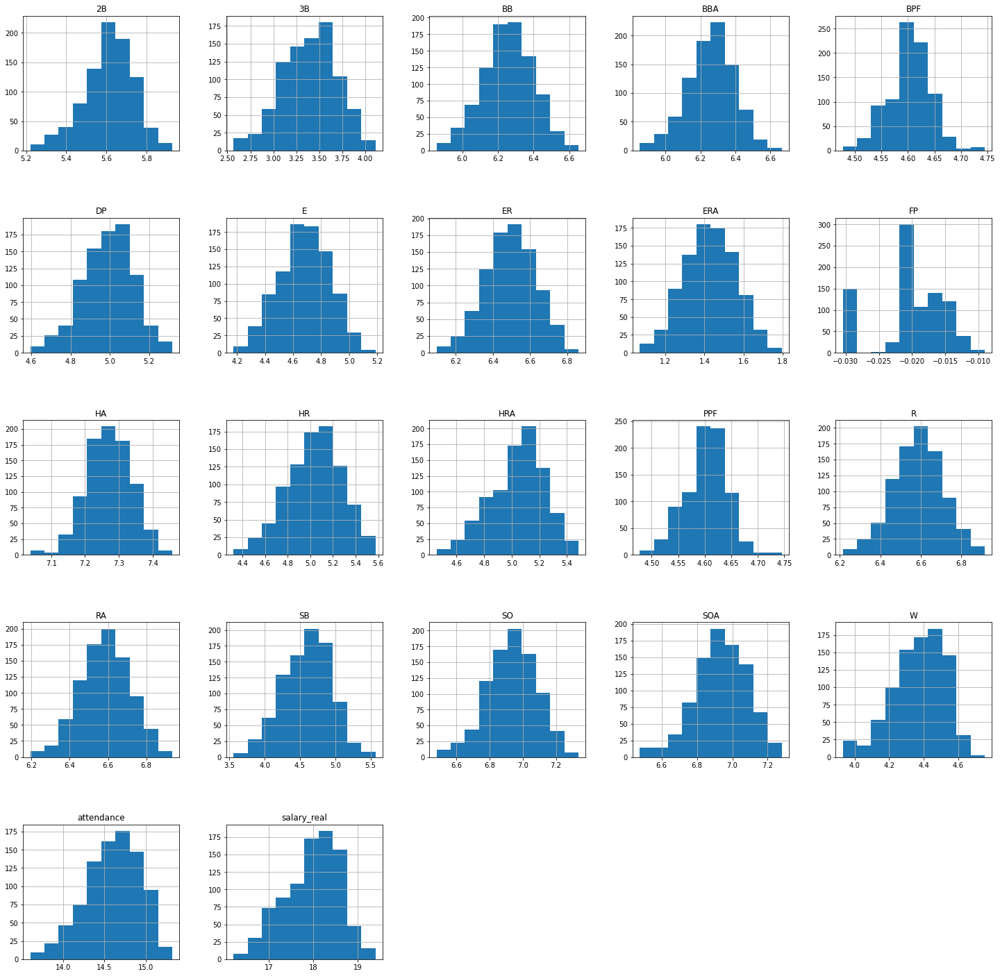

In [236]:
# districutions for the data
merged_all_log.hist(figsize=(25,25))
plt.subplots_adjust(hspace=0.5)

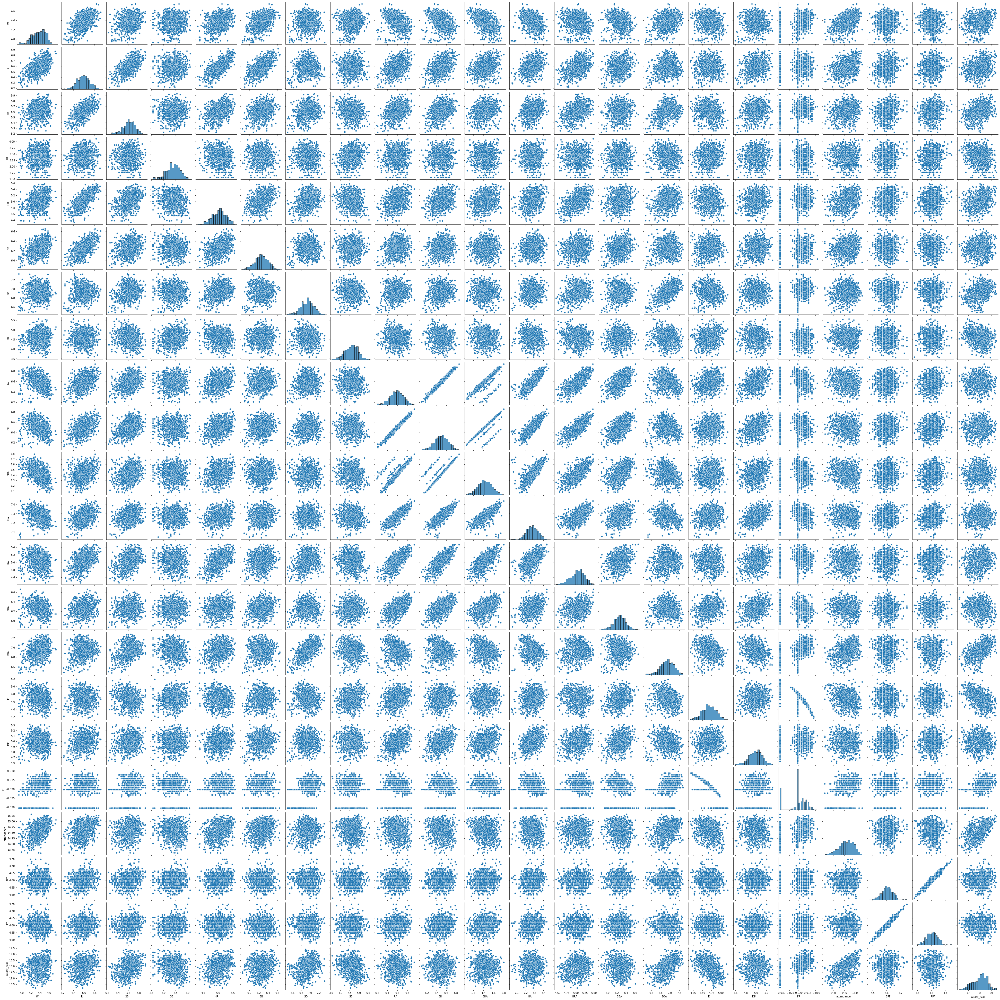

In [208]:
#sns.pairplot(merged_all_log,  palette='Set1')
#plt.show()

<AxesSubplot:>

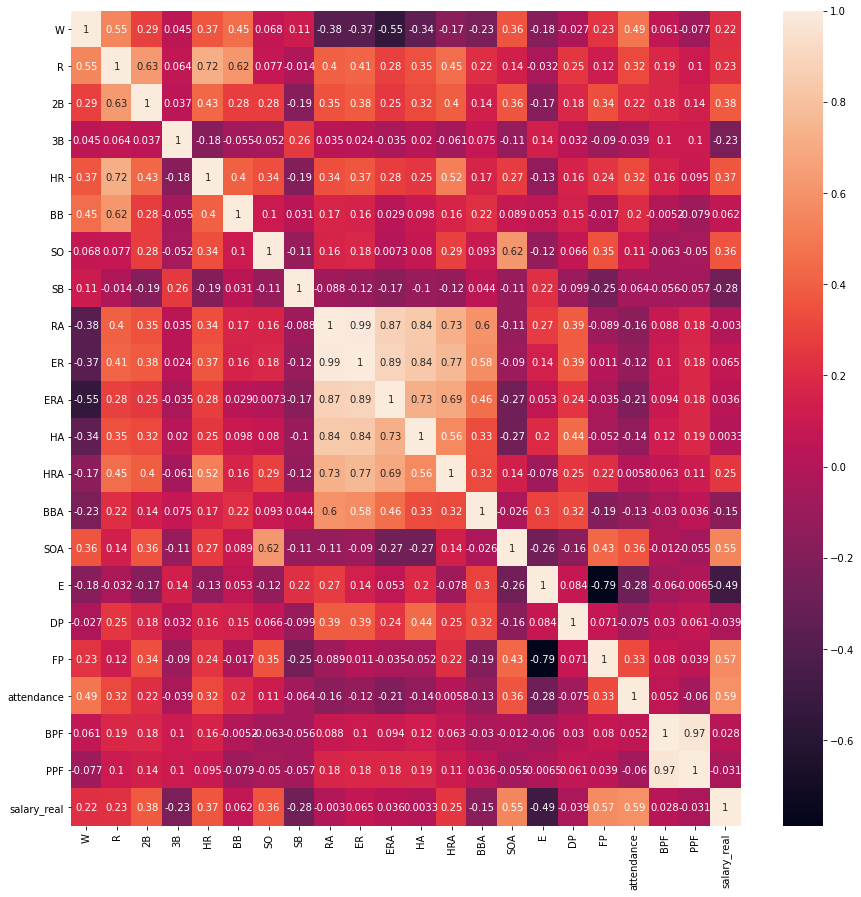

In [209]:
#Generating correlation heatmap for data
plt.subplots(figsize=(15,15))
sns.heatmap(merged_all_log.corr(), annot=True)

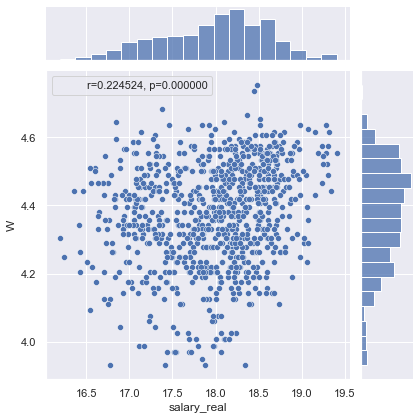

In [244]:
graph = sns.jointplot(data=merged_all_log,x='salary_real', y='W')
r, p = stats.pearsonr(merged_all_log.dropna().salary_real, merged_all_log.dropna().W)
# if you choose to write your own legend, then you should adjust the properties then
phantom, = graph.ax_joint.plot([], [], linestyle="", alpha=0)
# here graph is not a ax but a joint grid, so we access the axis through ax_joint method

graph.ax_joint.legend([phantom],['r={:f}, p={:f}'.format(r,p)])

In [245]:
p

8.313357349815625e-11

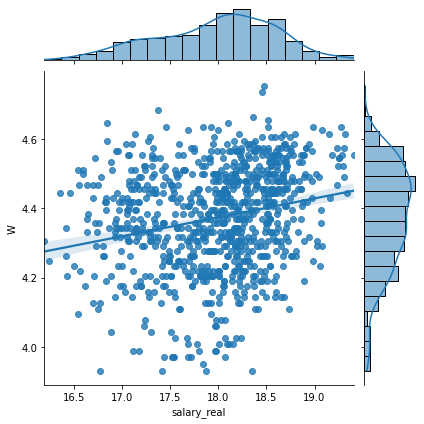

In [210]:
#Plot relationship between salary and wins
sns.jointplot(x='salary_real', y='W', data=merged_all_log, kind="reg")

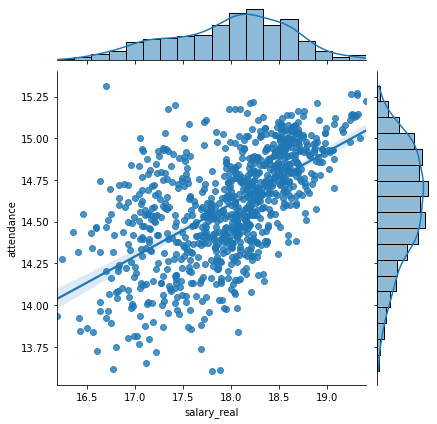

In [211]:
#Plot relationship between salary and attendance
sns.jointplot(x='salary_real', y='attendance', data=merged_all_log, kind="reg")

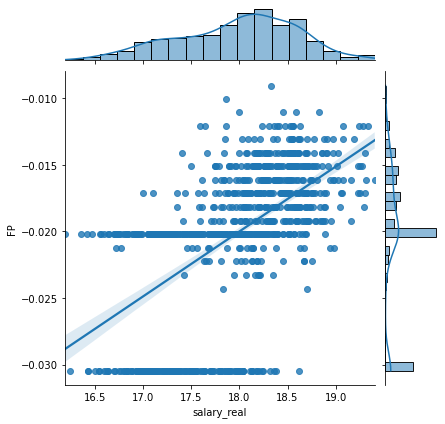

In [212]:
#Plot relationship between salary and field percentage
sns.jointplot(x='salary_real', y='FP', data=merged_all_log, kind="reg")

## lazypredict analysis

In [213]:
#split data into training and testing sets
merged_all_log_dropna = merged_all_log.dropna()
X_train, X_test, y_train, y_test = train_test_split(merged_all_log_dropna.drop(columns='W'), 
                                                    merged_all_log_dropna.W, test_size=0.3, 
                                                    random_state=47)

In [214]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((572, 21), (246, 21), (572,), (246,))

In [215]:
X_train.dtypes, X_test.dtypes, y_train.dtypes, y_test.dtypes

(R              float64
 2B             float64
 3B             float64
 HR             float64
 BB             float64
 SO             float64
 SB             float64
 RA             float64
 ER             float64
 ERA            float64
 HA             float64
 HRA            float64
 BBA            float64
 SOA            float64
 E              float64
 DP             float64
 FP             float64
 attendance     float64
 BPF            float64
 PPF            float64
 salary_real    float64
 dtype: object,
 R              float64
 2B             float64
 3B             float64
 HR             float64
 BB             float64
 SO             float64
 SB             float64
 RA             float64
 ER             float64
 ERA            float64
 HA             float64
 HRA            float64
 BBA            float64
 SOA            float64
 E              float64
 DP             float64
 FP             float64
 attendance     float64
 BPF            float64
 PPF            float64


In [216]:
reg_batch = LazyRegressor(verbose=0, ignore_warnings=False, custom_metric=None)
models_batch, predictions_batch = reg_batch.fit(X_train, X_test, y_train, y_test)

100%|██████████| 42/42 [00:05<00:00,  8.10it/s]


In [217]:
print(models_batch)

                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
TransformedTargetRegressor                   0.88       0.89  0.05        0.01
LinearRegression                             0.88       0.89  0.05        0.01
RidgeCV                                      0.88       0.89  0.05        0.02
LassoCV                                      0.88       0.89  0.05        0.12
ElasticNetCV                                 0.88       0.89  0.05        0.11
LassoLarsCV                                  0.88       0.89  0.05        0.04
Ridge                                        0.88       0.89  0.05        0.01
OrthogonalMatchingPursuitCV                  0.88       0.89  0.05        0.02
HuberRegressor                               0.88       0.89  0.05        0.08
BayesianRidge                                0.87       0.89  0.05        0.02
Lars                                         0.87   

## Looking into a linear regression

In [218]:
pipe = make_pipeline(
    StandardScaler(), 
    SelectKBest(score_func=f_regression),
    LinearRegression()
)

In [219]:
pipe.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('selectkbest',
                 SelectKBest(score_func=<function f_regression at 0x0000020E7F2BF160>)),
                ('linearregression', LinearRegression())])

In [220]:
y_tr_pred = pipe.predict(X_train)
y_te_pred = pipe.predict(X_test)

In [221]:
r2_score(y_train, y_tr_pred), r2_score(y_test, y_te_pred)

(0.8732712076844773, 0.8916317039924897)

In [222]:
mean_absolute_error(y_train, y_tr_pred), mean_absolute_error(y_test, y_te_pred)

(0.03837501191414898, 0.0391208873276984)

In [223]:
cv_results = cross_validate(pipe, X_train, y_train, cv=5)
cv_scores = cv_results['test_score']
cv_scores

array([0.83943903, 0.89491575, 0.87243745, 0.82147017, 0.89062204])

In [224]:
np.mean(cv_scores), np.std(cv_scores)

(0.8637768886730905, 0.028800995791599258)

In [225]:
np.round((np.mean(cv_scores) - 2 * np.std(cv_scores), np.mean(cv_scores) + 2 * np.std(cv_scores)), 2)

array([0.81, 0.92])

In [226]:
k = [k+1 for k in range(len(X_train.columns))]
grid_params = {'selectkbest__k': k}

In [227]:
lr_grid_cv = GridSearchCV(pipe, param_grid=grid_params, cv=5, n_jobs=-1)
lr_grid_cv.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('selectkbest',
                                        SelectKBest(score_func=<function f_regression at 0x0000020E7F2BF160>)),
                                       ('linearregression',
                                        LinearRegression())]),
             n_jobs=-1,
             param_grid={'selectkbest__k': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11,
                                            12, 13, 14, 15, 16, 17, 18, 19, 20,
                                            21]})

In [228]:
score_mean = lr_grid_cv.cv_results_['mean_test_score']
score_std = lr_grid_cv.cv_results_['std_test_score']
cv_k = [k for k in lr_grid_cv.cv_results_['param_selectkbest__k']]
lr_grid_cv.best_params_

{'selectkbest__k': 5}

Text(0.5, 1.0, 'Pipeline mean CV score (error bars +/- 1sd)')

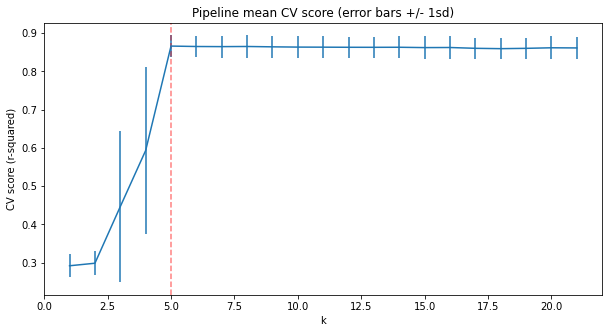

In [229]:
#Assign the value of k from the above dict of `best_params_` and assign it to `best_k`
best_k = lr_grid_cv.best_params_['selectkbest__k']
plt.subplots(figsize=(10, 5))
plt.errorbar(cv_k, score_mean, yerr=score_std)
plt.axvline(x=best_k, c='r', ls='--', alpha=.5)
plt.xlabel('k')
plt.ylabel('CV score (r-squared)')
plt.title('Pipeline mean CV score (error bars +/- 1sd)')

In [230]:
selected = lr_grid_cv.best_estimator_.named_steps.selectkbest.get_support()
coefs = lr_grid_cv.best_estimator_.named_steps.linearregression.coef_
features = X_train.columns[selected]
pd.Series(coefs, index=features).sort_values(ascending=False)

ER            0.11
R             0.10
attendance    0.01
RA           -0.10
ERA          -0.12
dtype: float64

## That turned out weird, let's try the random forest so we can order feature by importance (adj R-squared is still >0.8)

[0.78779874 0.84813741 0.79129868 0.79048451 0.84298097]
0.8121400619941748 0.02735981494492561
{'randomforestregressor__n_estimators': 379, 'standardscaler': StandardScaler()}
[0.79515203 0.84348222 0.79715868 0.78925989 0.84939889]


Text(0.5, 1.0, 'Best random forest regressor feature importances')

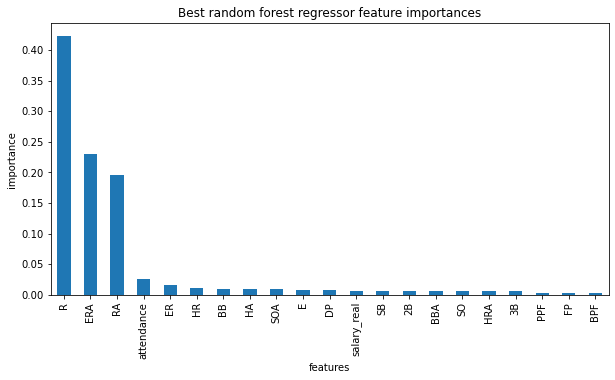

In [231]:
RF_pipe = make_pipeline(
    StandardScaler(),
    RandomForestRegressor(random_state=47)
)

rf_default_cv_results = cross_validate(RF_pipe, X_train, y_train, cv=5)
rf_cv_scores = rf_default_cv_results['test_score']
print(rf_cv_scores)
print(np.mean(rf_cv_scores), np.std(rf_cv_scores))
n_est = [int(n) for n in np.logspace(start=1, stop=3, num=20)]
grid_params = {
        'randomforestregressor__n_estimators': n_est,
        'standardscaler': [StandardScaler(), None]
}
grid_params
rf_grid_cv = GridSearchCV(RF_pipe, param_grid=grid_params, cv=5, n_jobs=-1)
rf_grid_cv.fit(X_train, y_train)
print(rf_grid_cv.best_params_)

rf_best_cv_results = cross_validate(rf_grid_cv.best_estimator_, X_train, y_train, cv=5)
rf_best_scores = rf_best_cv_results['test_score']
print(rf_best_scores)

np.mean(rf_best_scores), np.std(rf_best_scores)
plt.subplots(figsize=(10, 5))
imps = rf_grid_cv.best_estimator_.named_steps.randomforestregressor.feature_importances_
rf_feat_imps = pd.Series(imps, index=X_train.columns).sort_values(ascending=False)
rf_feat_imps.plot(kind='bar')
plt.xlabel('features')
plt.ylabel('importance')
plt.title('Best random forest regressor feature importances')


## Let's look at salary as the response variable

In [232]:
#split data into training and testing sets
merged_all_log_dropna = merged_all_log.dropna()
X_train, X_test, y_train, y_test = train_test_split(merged_all_log_dropna.drop(columns='salary_real'), 
                                                    merged_all_log_dropna.salary_real, test_size=0.3, 
                                                    random_state=47)

In [234]:
reg_batch = LazyRegressor(verbose=0, ignore_warnings=False, custom_metric=None)
models_batch, predictions_batch = reg_batch.fit(X_train, X_test, y_train, y_test)

100%|██████████| 42/42 [00:04<00:00,  8.68it/s]


In [235]:
print(models_batch)

                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
ExtraTreesRegressor                          0.70       0.72  0.32        0.30
GradientBoostingRegressor                    0.67       0.70  0.33        0.20
HistGradientBoostingRegressor                0.67       0.69  0.34        1.15
RandomForestRegressor                        0.66       0.69  0.34        0.48
NuSVR                                        0.66       0.69  0.34        0.04
SVR                                          0.66       0.69  0.34        0.03
LGBMRegressor                                0.65       0.68  0.34        0.15
AdaBoostRegressor                            0.64       0.67  0.35        0.15
XGBRegressor                                 0.64       0.67  0.35        0.12
LassoLarsIC                                  0.62       0.65  0.36        0.02
PoissonRegressor                             0.61   

[0.71465176 0.73262185 0.62145946 0.65579248 0.68130428]
0.6811659677133096 0.039944226103675644
{'randomforestregressor__n_estimators': 615, 'standardscaler': None}
[0.71502676 0.74213715 0.62012234 0.65437049 0.68136359]


Text(0.5, 1.0, 'Best random forest regressor feature importances')

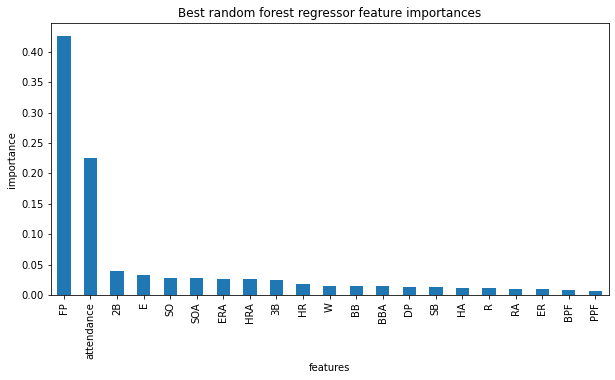

In [233]:
RF_pipe = make_pipeline(
    StandardScaler(),
    RandomForestRegressor(random_state=47)
)

rf_default_cv_results = cross_validate(RF_pipe, X_train, y_train, cv=5)
rf_cv_scores = rf_default_cv_results['test_score']
print(rf_cv_scores)
print(np.mean(rf_cv_scores), np.std(rf_cv_scores))
n_est = [int(n) for n in np.logspace(start=1, stop=3, num=20)]
grid_params = {
        'randomforestregressor__n_estimators': n_est,
        'standardscaler': [StandardScaler(), None]
}
grid_params
rf_grid_cv = GridSearchCV(RF_pipe, param_grid=grid_params, cv=5, n_jobs=-1)
rf_grid_cv.fit(X_train, y_train)
print(rf_grid_cv.best_params_)

rf_best_cv_results = cross_validate(rf_grid_cv.best_estimator_, X_train, y_train, cv=5)
rf_best_scores = rf_best_cv_results['test_score']
print(rf_best_scores)

np.mean(rf_best_scores), np.std(rf_best_scores)
plt.subplots(figsize=(10, 5))
imps = rf_grid_cv.best_estimator_.named_steps.randomforestregressor.feature_importances_
rf_feat_imps = pd.Series(imps, index=X_train.columns).sort_values(ascending=False)
rf_feat_imps.plot(kind='bar')
plt.xlabel('features')
plt.ylabel('importance')
plt.title('Best random forest regressor feature importances')